In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import time
from typing import List
from __future__ import annotations  # Forward references automatically handled
from PIL import Image
from IPython.display import Image as IPImage, display
import os
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import shutil

In [2]:
# helper functions
def limit_vector_magnitude(vector, max_magnitude):
    magnitude = np.linalg.norm(vector)
    if magnitude > max_magnitude:
        return (vector / magnitude) * max_magnitude
    return vector

def get_distance(vector1, vector2):
    return np.linalg.norm(vector1 - vector2)

In [3]:
from enum import Enum

class AgentType(Enum):
    AgentTypePredator = "PREDATOR"
    AgentTypePrey = "PREY"
    AgentTypeNone = "NONE"

In [4]:
class Agent:
    def __init__(self, position=(0,0), agent_type:AgentType = AgentType.AgentTypeNone):
        self.id = np.random.randint(100000)
        self.position = np.asarray(position)
        self.agent_type = agent_type

    def step(self):
        return self.position

In [5]:
class Prey(Agent):
    def __init__(self, position=(0,0), velocity=[0,0]):
        super().__init__(position, AgentType.AgentTypePrey)
        self.velocity = limit_vector_magnitude(np.asarray(velocity), 1)
        self.speed = 1

        self.initial_position = np.copy(self.position)
        self.initial_velocity = np.copy(self.velocity)

    def reset(self):
        self.position = np.copy(self.initial_position)
        self.velocity = np.copy(self.initial_velocity)

    def step(self, predators):
        # todo: move to averge velocity of prey
        next_velocity = self.average_velocity(predators)
        next_velocity = limit_vector_magnitude(next_velocity, self.speed)
        next_position = self.position + next_velocity
        self.position = next_position
        return self.position

    # compute the average velocity directions of predators
    def average_velocity(self, predators):
        velocity_arr = np.asarray([p.velocity for p in predators])
        total_velocity = np.sum(velocity_arr, axis=0)
        average_velocity = total_velocity / len(predators)
        return limit_vector_magnitude(average_velocity, self.speed)

In [6]:
class Predator(Agent):
    def __init__(self, position=(0,0)):
        super().__init__(position, AgentType.AgentTypePredator)
        self.alpha_actor = np.array([.01])  # Now has shape (1,)
        self.alpha_critic = .01
        self.gamma = .99

        self.position_weights = np.random.rand(2)  # To match a 2D position vector
        self.position_bias = np.random.rand(2)    # Same as above

        self.velocity_weights = np.random.rand(2)
        self.velocity_bias = np.random.rand(2)

        self.critic_weights = np.random.rand(1)
        self.critic_bias = np.random.rand(1)

        self.velocity = limit_vector_magnitude(np.asarray([1,1]), 1)
        self.speed = 1.2

        self.initial_position = np.copy(self.position)
        self.initial_velocity = np.copy(self.velocity)

        self.agent_position_weights = np.random.rand(2)
        self.agent_position_bias = np.random.rand(2)

        self.agent_velocity_weights = np.random.rand(2)
        self.agent_velocity_bias = np.random.rand(2)

        self.reward = np.zeros(1)

        self.longest_distance = np.zeros(1)

    def reset(self):
        self.position = np.copy(self.initial_position)
        self.velocity = np.copy(self.initial_velocity)

    def step(self, prey, predators):
        policy = self.policy(prey, predators)

        # print(f"policy:{policy.shape}")

        next_velocity = limit_vector_magnitude(policy, self.speed)
        next_position = self.position + next_velocity
        # reward = self.reward(prey, next_position)

        # print(f"next_velocity:{next_velocity.shape}")


        # compute TD ERROR
        td_error = self.reward + self.gamma * self.critic(prey, next_position) - self.critic(prey, self.position)

        # update critic
        self.critic_weights += self.alpha_critic * td_error * get_distance(next_position, self.position)
        self.critic_bias += self.alpha_critic * td_error

        # update agent
        # print(f"td_error: {td_error.shape}")
        # print(f"position_weights: {self.position_weights.shape}")
        # print(f"alpha_actor: {self.alpha_actor.shape}")
        # print(f"self.position: {self.position.shape}")
        # print(f"next_position: {next_position.shape}")

        # update the agent weights and biases
        self.position_weights += self.alpha_actor * td_error * (next_position - self.position)
        self.position_bias += self.alpha_actor * td_error * (next_position - self.position)

        self.velocity_weights += self.alpha_actor * td_error * (next_velocity - self.velocity)
        self.velocity_bias += self.alpha_actor * td_error * (next_velocity - self.velocity)

        self.agent_position_weights += self.alpha_actor * td_error * (next_position - self.position)
        self.agent_position_bias += self.alpha_actor * td_error * (next_position - self.position)

        self.agent_velocity_weights += self.alpha_actor * td_error * (next_position - self.position)
        self.agent_velocity_bias += self.alpha_actor * td_error * (next_position - self.position)
        
        # update position
        self.velocity = next_velocity
        self.position = next_position

        return self.position

    def policy(self, prey, predators)->np.ndarray:
        # other_agents = self.calculate_other_agents_position(predators)
        # other_agents = limit_vector_magnitude(other_agents, self.speed)

        other_agents = self.calculate_other_agents_state(predators)
        other_agents = limit_vector_magnitude(other_agents, self.speed)

        position_based = prey.position - self.position
        velocity_based = prey.velocity - self.velocity

        # print(f"position_based: {position_based.shape}")
        # print(f"velocity_based: {velocity_based.shape}")
        # print(f"other_agents: {other_agents.shape}")

        # decide which value should be used
        return (self.position_weights * position_based + self.position_bias) + (self.velocity_weights * velocity_based + self.velocity_bias) + other_agents

    # make sure the total number of agents are 3!
    def calculate_other_agents_position(self, agents: List[Predator]):
        if len(agents) < 2:
            print(f"predator must be 2! length: {len(agents)}")

            return np.asarray([0,0])

        positions_array = np.array([predator.position for predator in predators])
        positions_sum = np.sum(positions_array, axis=0)

        # print(f"positions_sum: {positions_sum.shape}")

        return positions_sum @ self.agent_position_weights + self.agent_position_bias

    # make sure the total number of agents are 3!
    def calculate_other_agents_state(self, agents: List[Predator]):
        if len(agents) < 2:
            print(f"predator must be 2! length: {len(agents)}")

            return np.asarray([0,0])

        positions_array = np.array([predator.position for predator in predators])
        positions_sum = np.sum(positions_array, axis=0)

        # print(f"positions_sum: {positions_sum.shape}")

        position_state = positions_sum @ self.agent_position_weights + self.agent_position_bias

        velocity_array = np.positions_array = np.array([predator.velocity for predator in predators])
        velocity_sum = np.sum(velocity_array, axis=0)

        velocity_state = velocity_sum @ self.agent_velocity_weights + self.agent_velocity_bias

        return position_state + velocity_state
    
    # calculate the distance as critic
    def critic(self, prey, position):
        return self.critic_weights * get_distance(prey.position, position) + self.critic_bias

    # longer distance means small reward
    # todo: make the reward calculation given by the environment
    # def reward(self, prey, position):
    #     return get_distance(prey.position, position) * -1
    def give_reward(self, value):
        self.reward = value

In [7]:
class LoggingData:
    def __init__(self):
        self.step = []
        self.predator_position = {}
        self.prey_position = []
        self.predator_reward = []

In [8]:
class World:
    def __init__(self, prey, predators=[], scenario = ""):
        self.predators = predators;
        self.prey = prey;
        self.agents = [self.prey] + self.predators
        self.log_data = {
            "episode": [] # array of LoggingData
        }
        self.scenario = scenario

        folder_path = f"./{self.scenario}"
        if os.path.exists(folder_path):
            shutil.rmtree(folder_path)
        os.mkdir(folder_path)
        

    def simulate(self, episodes, max_steps, min_distance):
        for i in tqdm(range(episodes), desc="Simulating.."):
            # time.sleep(0.01) # artificial delay so the tqdm can work

            logging_data = LoggingData()

            # init predator position
            for j in range(len(self.predators)):
                logging_data.predator_position[self.predators[j].id] = []
                self.predators[j].reset()

            # init prey position
            self.prey.reset()

            is_catched = False

            predator_farthest_distances = np.zeros(1)

            for j in range(max_steps):
                if is_catched:
                    break
                logging_data.step.append(j)
                for agent in self.agents:
                    if agent.agent_type == AgentType.AgentTypePredator:
                        # Get other predators
                        other_predators = [_predator for _predator in self.predators if agent.id != _predator.id]

                        position = agent.step(self.prey, other_predators)
                        # calculate distance
                        # to give the reward based on the furtherst distance
                        distance = get_distance(self.prey.position, position)
                        if predator_farthest_distances == np.zeros(1) :
                            predator_farthest_distances = distance
                        else:
                            if distance < predator_farthest_distances:
                                predator_farthest_distances = distance


                        logging_data.predator_position[agent.id].append(position)

                        # logging_data.predator_reward.append(agent.reward(self.prey, position))
                        if get_distance(self.prey.position, agent.position) < min_distance:
                            print(f"Predator ate prey at step {j} in episode {i}")
                            is_catched = True
                    elif agent.agent_type == AgentType.AgentTypePrey:
                        position = agent.step(self.predators)
                        logging_data.prey_position.append(position)

            for predator in self.predators:
                predator.give_reward(predator_farthest_distances * -1)

            logging_data.predator_reward.append(predator_farthest_distances * -1)

            self.log_data["episode"].append(logging_data)
        

    def animate(self, selected_episode):
        frames = []
        
        folder_path = f"./{self.scenario}/episode{selected_episode}"
        if os.path.exists(folder_path):
            shutil.rmtree(folder_path)
        os.mkdir(folder_path)

        fig, axes = plt.subplots(figsize=(12, 6))

        selected_log = self.log_data["episode"][selected_episode]

        for step in range(len(selected_log.step)):

            # Scatter plot of positions
            for predator_idx in selected_log.predator_position:
                predatorX_position = selected_log.predator_position[predator_idx][step]
                axes.scatter(predatorX_position[0], predatorX_position[1], c='red', s=10)  # Predator

            prey_position = selected_log.prey_position[step]
            axes.scatter(prey_position[0], prey_position[1], c='blue', s=10)  # Prey

            axes.set_title('Positions of Predator and Prey')
            axes.set_xlabel('X Position')
            axes.set_ylabel('Y Position')

            plt.close(fig)
            frame_path = f"./{folder_path}/frame_{step}.png"
            fig.savefig(frame_path)
            frames.append(frame_path)

        images = [Image.open(frame) for frame in frames]
        gif_path = f"./{folder_path}/episode_{selected_episode}.gif"
        images[0].save(gif_path, save_all=True, append_images=images[1:], loop=0, duration=100)

        display(IPImage(gif_path))

        # Cleanup
        for frame in frames:
            os.remove(frame)


    # plot the position of each agent
    def plot(self, selected_episode):
        fig, axes = plt.subplots(2, 2, figsize=(12, 6))

        selected_log = self.log_data["episode"][selected_episode]

        # Scatter plot of positions
        for predator_idx in selected_log.predator_position:
            predatorX_positions = selected_log.predator_position[predator_idx]
            for predator_position in predatorX_positions:
                axes[0][0].scatter(predator_position[0], predator_position[1], c='red', s=10)  # Predator

        for i in range(len(selected_log.prey_position)):
            prey_position = selected_log.prey_position[i]
            axes[0][0].scatter(prey_position[0], prey_position[1], c='blue', s=10)  # Prey

        axes[0][0].set_title('Positions of Predator and Prey')
        axes[0][0].set_xlabel('X Position')
        axes[0][0].set_ylabel('Y Position')
        axes[0][0].legend(['Predator 1', 'Predator 2', 'Predator 3' , 'Prey'])  # Add a single legend
        axes[0][0].grid()

        # Line plot of the distance
        # predator_positions = np.array(selected_log.predator_position)
        # prey_positions = np.array(selected_log.prey_position)
        # distances = np.linalg.norm(predator_positions - prey_positions, axis=1)
        # axes[0][1].plot(selected_log.step, distances, label='Distance', color='green')
        # axes[0][1].set_title('Distance Over Time')
        # axes[0][1].set_xlabel('Step')
        # axes[0][1].set_ylabel('Distance')
        # axes[0][1].legend()
        # axes[0][1].grid()

        # plot the reward over time
        # axes[1][0].plot(selected_log.step, selected_log.predator_reward, label='Reward', color='orange')
        # axes[1][0].set_title('Reward Over Time')
        # axes[1][0].legend()
        # axes[1][0].grid()

        plt.tight_layout()
        plt.show()

    #TODO: create animation method
    def create_animation(self, selected_episode):
        selected_log = self.log_data["episode"][selected_episode]

        fig, ax = plt.subplots(figsize=(12, 8))
        ax.set_title("Simulation Animation")
        ax.set_xlabel("X Position")
        ax.set_ylabel("Y Position")

        prey_scatter = ax.scatter(selected_log.prey_position[0][0], selected_log.prey_position[0][1], c='blue', s=50, label='Prey')
        # predator_scatters = [
        #     ax.scatter([], [], c='red', s=50, label=f'Predator {idx}') for idx in selected_log.predator_position.keys()
        # ]
        ax.legend()

        def update(frame, prey_scatter, selected_log):
            prey_position = selected_log.prey_position[frame]
            prey_scatter.set_offsets(prey_position)

            # for idx, scatter in enumerate(predator_scatters):
            #     predator_positions = list(selected_log.predator_position.values())
            #     scatter.set_offsets(predator_positions[idx][frame])

            return [prey_scatter]

        anim = FuncAnimation(
            fig, update, frames=len(selected_log.step), fargs=(prey_scatter, selected_log), blit=True
        )

        # anim.save(f"{self.scenario}_episode_{selected_episode}.mp4", fps=10, extra_args=['-vcodec', 'libx264'])
        plt.close(fig)
        # print(f"Animation saved as {self.scenario}_episode_{selected_episode}.mp4")
        return anim

    def display_animation(self, selected_episode):
        anim = self.create_animation(selected_episode)
        display(HTML(anim.to_jshtml()))

## Default Scenario

In [10]:
num_episodes = 500
max_steps = 300
min_distance = 2

predators = [Predator(), Predator(position=(20,20)), Predator(position=(30,30))]
prey = Prey(position=(10,100), velocity=[1,0])
world = World(prey, predators, "world_default")
world.simulate(num_episodes, max_steps, min_distance)

Simulating..:   0%|          | 0/500 [00:00<?, ?it/s]

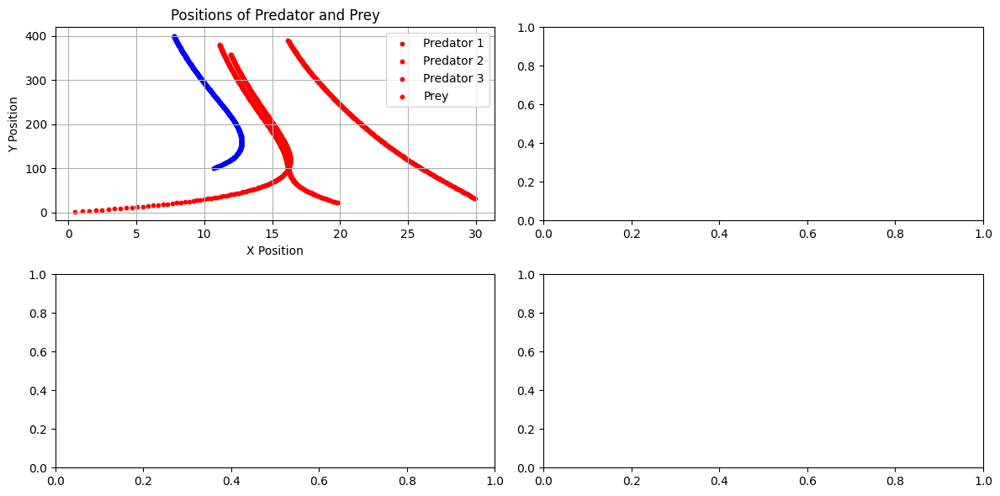

In [11]:
world.plot(0)

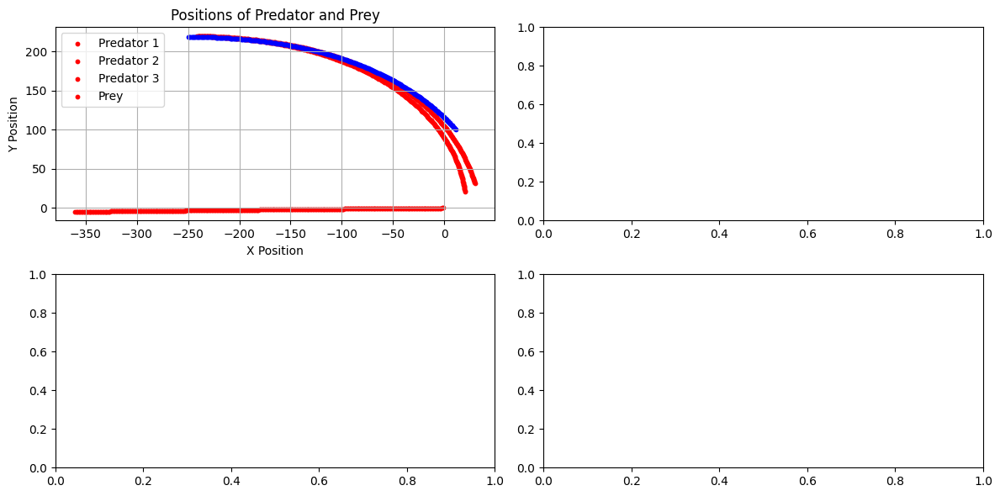

In [13]:
world.plot(499)

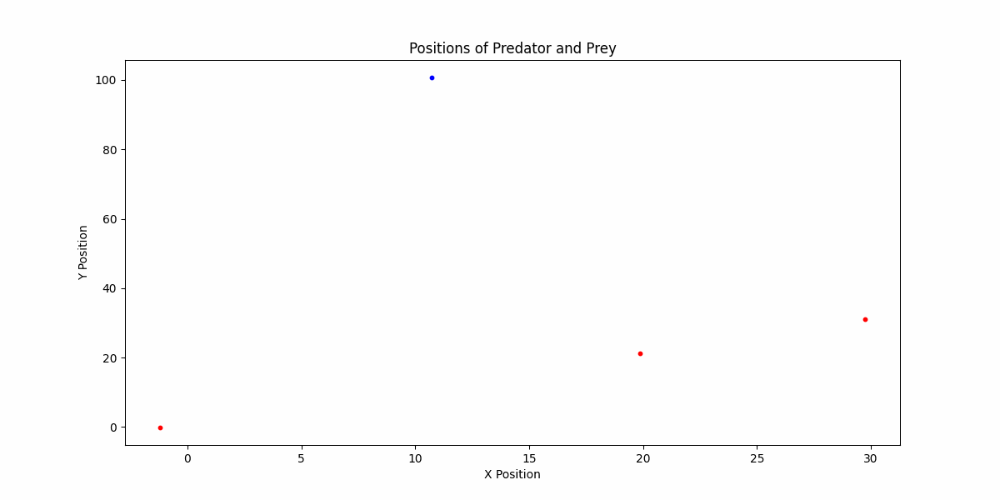

In [14]:
world.animate(499)

## Scenario 1 (3 vs 1 Bow)

In [124]:
num_episodes = 1000
max_steps = 300
min_distance = 2

predators1 = [Predator(position=(10,10)), Predator(position=(5,20)), Predator(position=(10,30))]
prey1 = Prey(position=(50,20), velocity=[1,0])
world1 = World(prey1, predators1, "world_1")
world1.simulate(num_episodes, max_steps, min_distance)

Simulating..:   0%|          | 0/1000 [00:00<?, ?it/s]

Predator ate prey at step 74 in episode 3
Predator ate prey at step 180 in episode 4
Predator ate prey at step 219 in episode 5
Predator ate prey at step 193 in episode 6
Predator ate prey at step 171 in episode 7
Predator ate prey at step 176 in episode 8
Predator ate prey at step 178 in episode 9
Predator ate prey at step 180 in episode 10
Predator ate prey at step 185 in episode 11
Predator ate prey at step 179 in episode 12
Predator ate prey at step 184 in episode 13
Predator ate prey at step 192 in episode 14
Predator ate prey at step 196 in episode 15
Predator ate prey at step 200 in episode 16
Predator ate prey at step 204 in episode 17
Predator ate prey at step 207 in episode 18
Predator ate prey at step 211 in episode 19
Predator ate prey at step 214 in episode 20
Predator ate prey at step 216 in episode 21
Predator ate prey at step 219 in episode 22
Predator ate prey at step 220 in episode 23
Predator ate prey at step 221 in episode 24
Predator ate prey at step 223 in episode

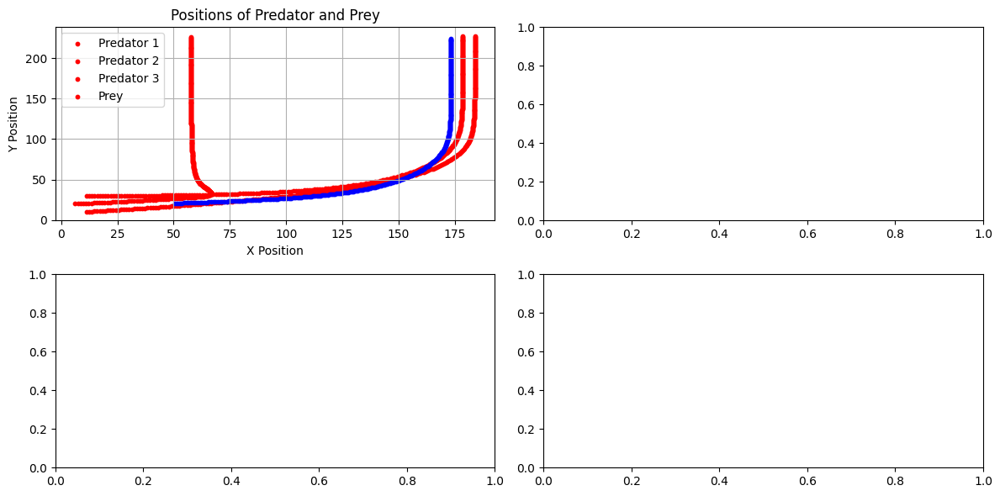

In [125]:
world1.plot(0)

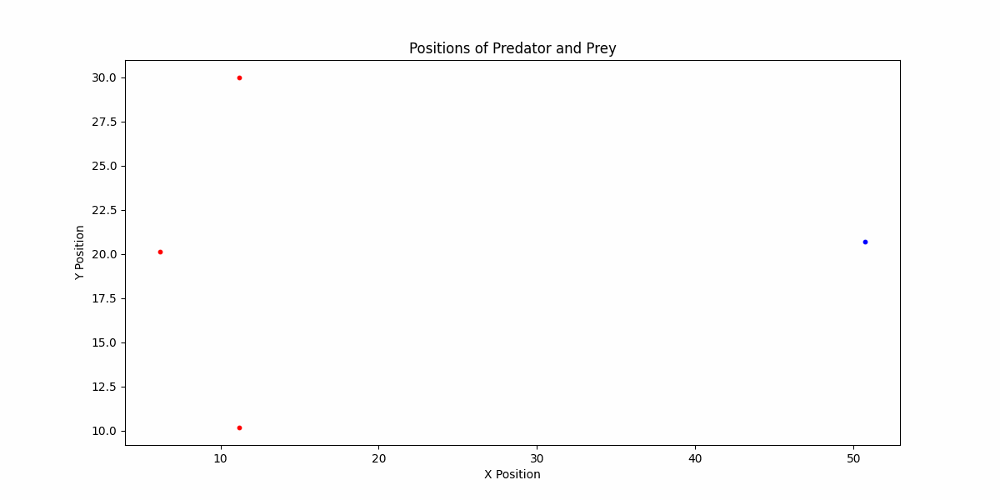

In [126]:
world1.animate(0)

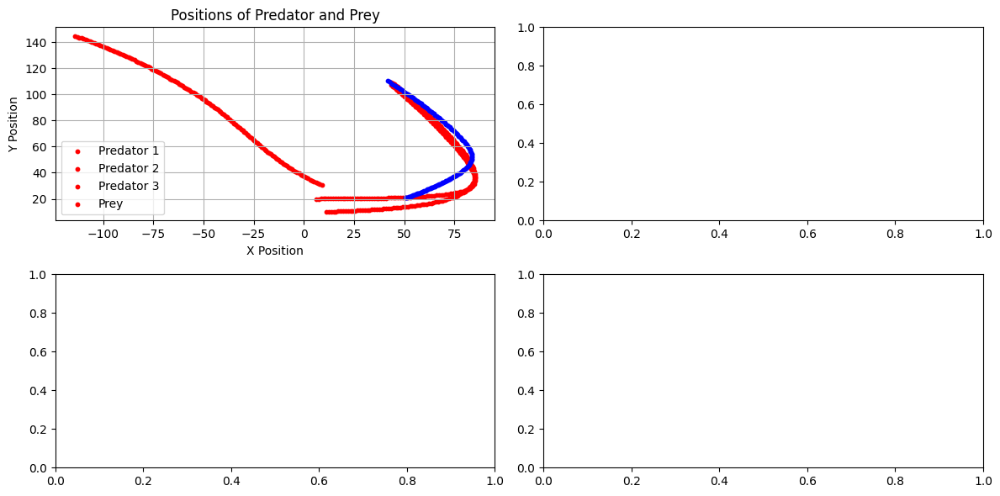

In [127]:
world1.plot(499)

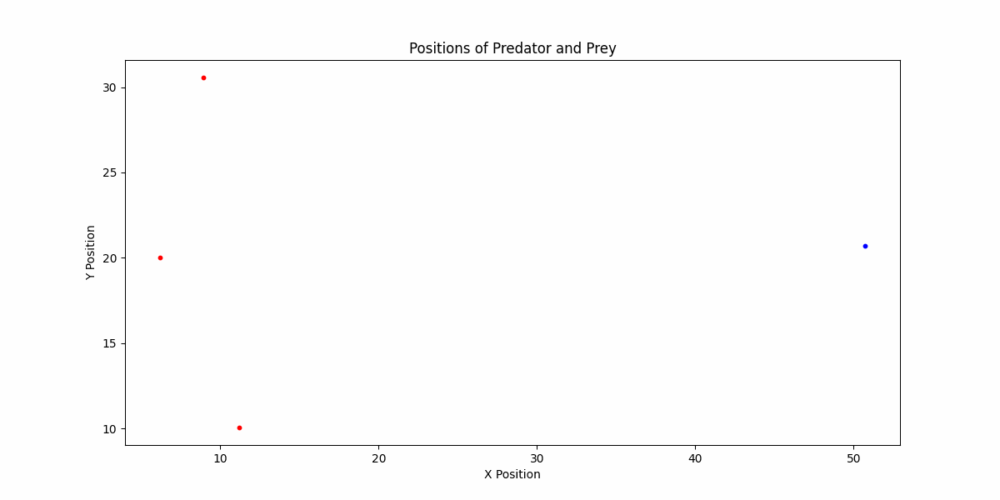

In [128]:
world1.animate(499)

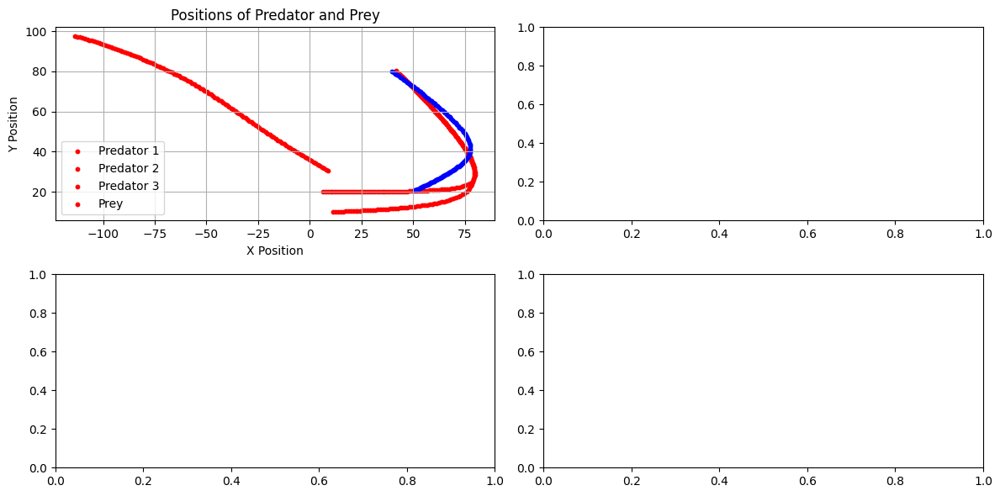

In [129]:
world1.plot(999)

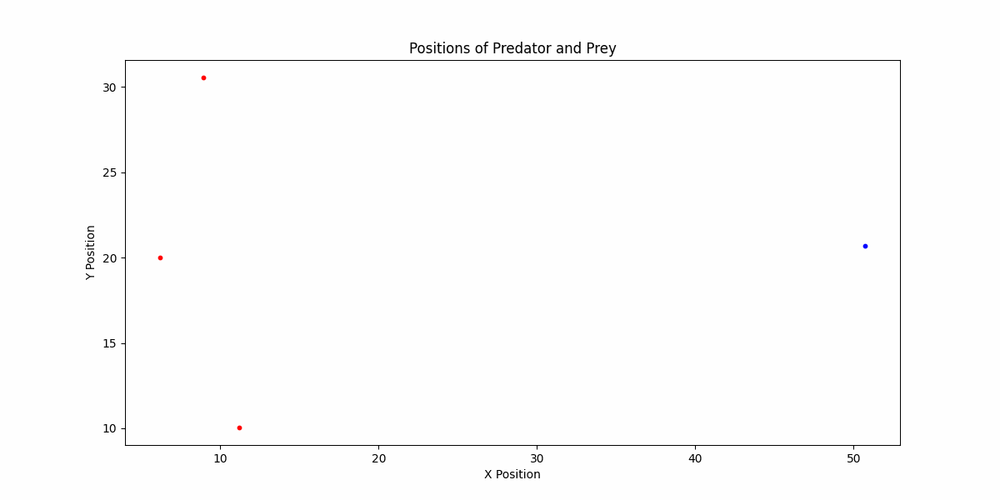

In [130]:
world1.animate(999)

## Scenario 2 (3 vs 1 Triangle Trap)

In [131]:
num_episodes = 1000
max_steps = 300
min_distance = 2

predators2 = [Predator(position=(50,50)), Predator(position=(40,90)), Predator(position=(60,90))]
prey2 = Prey(position=(50,70), velocity=[1,0])
world2 = World(prey2, predators2, "world2")
world2.simulate(num_episodes, max_steps, min_distance)

Simulating..:   0%|          | 0/1000 [00:00<?, ?it/s]

Predator ate prey at step 211 in episode 3
Predator ate prey at step 33 in episode 4
Predator ate prey at step 37 in episode 5
Predator ate prey at step 34 in episode 6
Predator ate prey at step 36 in episode 7
Predator ate prey at step 104 in episode 8
Predator ate prey at step 84 in episode 11
Predator ate prey at step 145 in episode 136
Predator ate prey at step 17 in episode 137
Predator ate prey at step 18 in episode 138
Predator ate prey at step 20 in episode 139
Predator ate prey at step 19 in episode 140
Predator ate prey at step 22 in episode 141
Predator ate prey at step 24 in episode 142
Predator ate prey at step 25 in episode 143
Predator ate prey at step 26 in episode 144
Predator ate prey at step 26 in episode 145
Predator ate prey at step 26 in episode 146
Predator ate prey at step 26 in episode 147
Predator ate prey at step 26 in episode 148
Predator ate prey at step 26 in episode 149
Predator ate prey at step 27 in episode 150
Predator ate prey at step 27 in episode 15

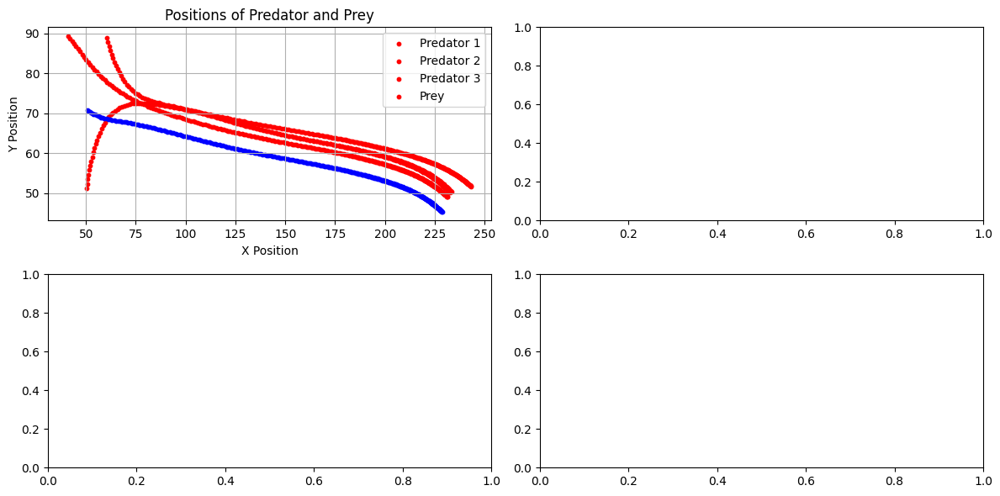

In [132]:
world2.plot(0)

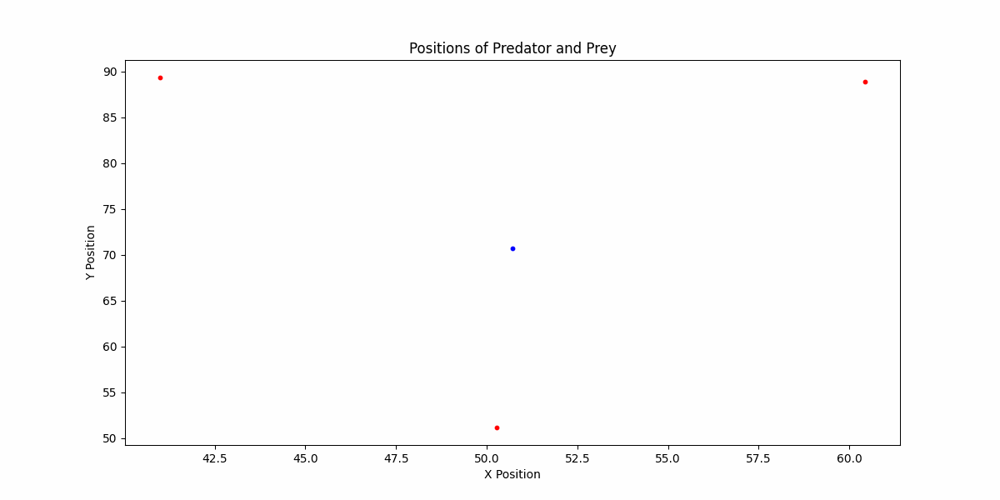

In [134]:
world2.animate(0)

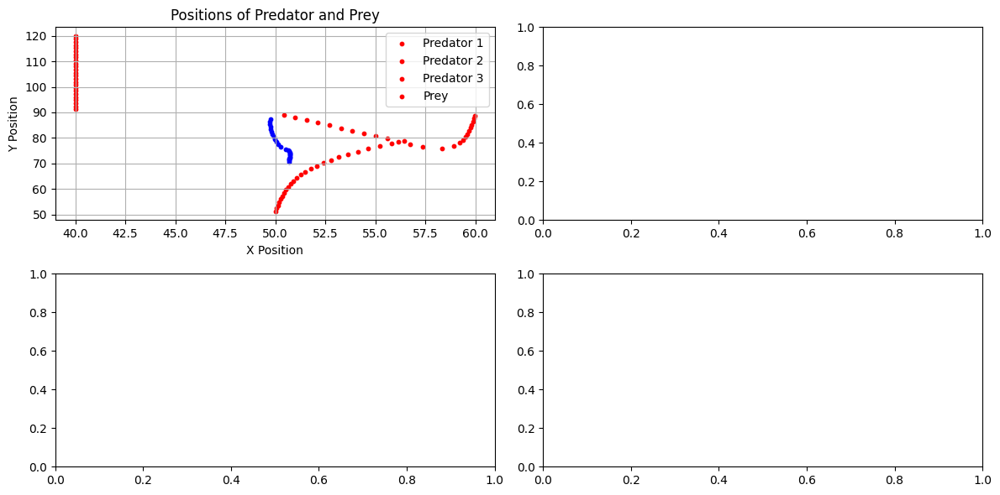

In [135]:
world2.plot(499)

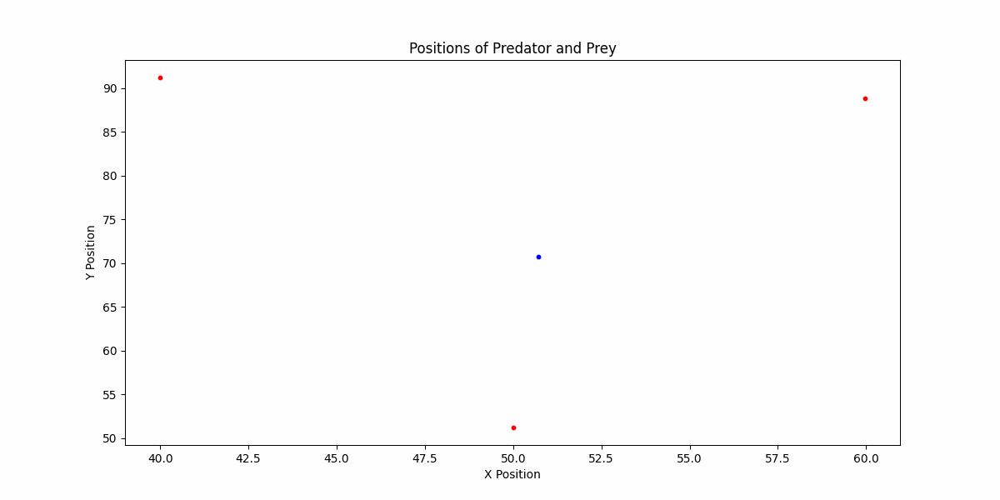

In [136]:
world2.animate(499)

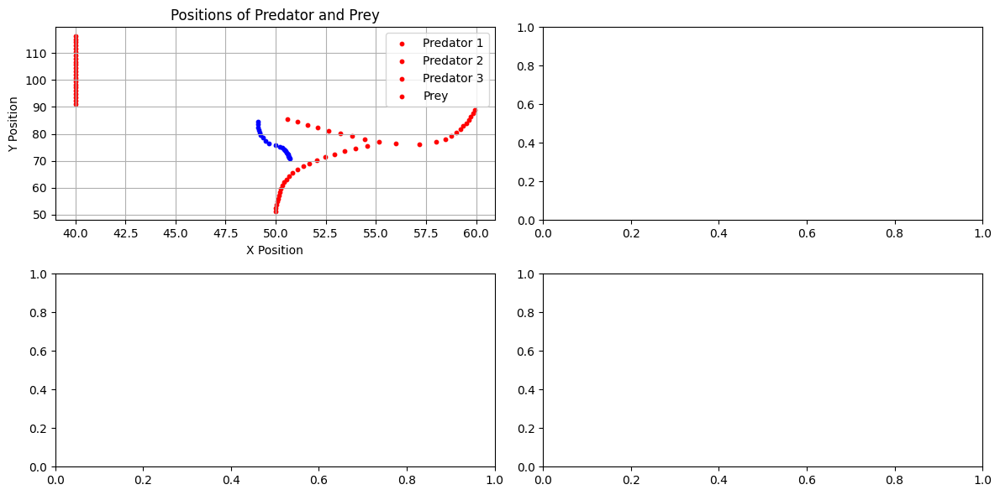

In [137]:
world2.plot(999)

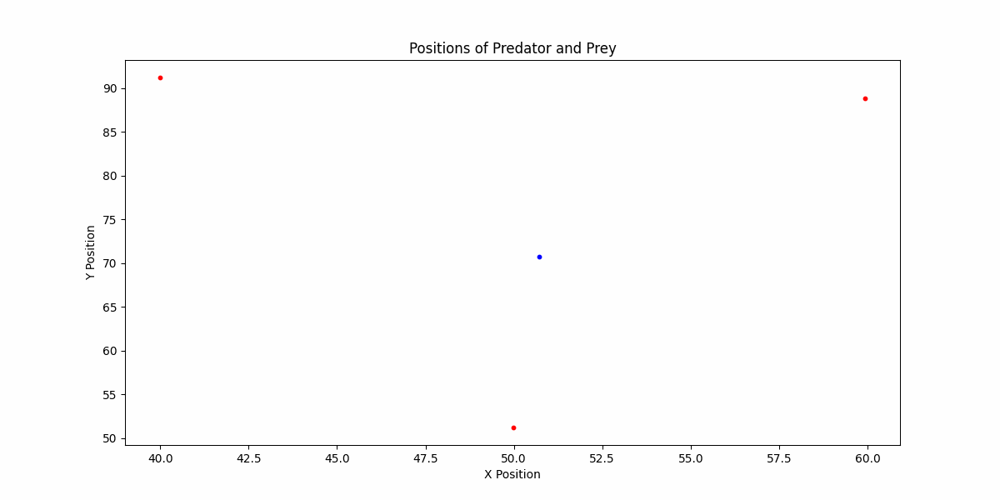

In [138]:
world2.animate(999)